## Imports

In [1]:
# Use Benoit's feature branch so I can sel along non-dimension coordinates
#!pip install git+https://github.com/benbovy/xarray.git@add-set-xindex-and-drop-indexes

In [2]:
import xarray as xr

In [3]:
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt

In [4]:
import os

## Open the data

In [5]:
import json
import gcsfs

In [6]:
# persistent bucket
target_url = 'gs://leap-persistent/tomnicholas/hero-calc/compute/llc4320/vort_strain_div_histogram_coarsen_nan_padding.zarr'

In [7]:
with open('../pangeo-forge-4967-3ebd505f8a5b.json') as token_file:
    token = json.load(token_file)
    
target_fs = gcsfs.GCSFileSystem(token=token)

target_mapper = target_fs.get_mapper(target_url)

In [8]:
hist_ds = xr.open_dataset(target_url, engine="zarr")

In [9]:
# cleaning up how I stored the vertices before I realised there was a CF-convention way of doing it
hist_ds = hist_ds.drop(
    [
        'vertex_1_x',
        'vertex_1_y',
        'vertex_2_x',
        'vertex_2_y',
        'vertex_3_x',
        'vertex_3_y',
        'vertex_4_x',
        'vertex_4_y',
    ]
)

In [10]:
from xarray.indexes import PandasIndex

# have to add the index ourselves manually for some reason
hist_ds = hist_ds.set_xindex('region_num', PandasIndex)

In [11]:
hist_ds

<xarray.Dataset>
Dimensions:                    (div_bin: 99, region: 437, time: 37,
                                vort_bin: 99, strain_bin: 49, vertices: 4)
Coordinates:
  * div_bin                    (div_bin) float64 -4.949 -4.848 ... 4.848 4.949
    face                       (region) int64 ...
    i_region_coarse            (region) int64 ...
    j_region_coarse            (region) int64 ...
  * region_num                 (region) int64 4 5 6 7 13 ... 791 792 793 798 799
  * strain_bin                 (strain_bin) float64 0.05102 0.1531 ... 4.949
  * time                       (time) datetime64[ns] 2011-09-17T12:00:00 ... ...
    vertices_latitude          (vertices, region) float32 ...
    vertices_longitude         (vertices, region) float32 ...
  * vort_bin                   (vort_bin) float64 -4.949 -4.848 ... 4.848 4.949
Dimensions without coordinates: region, vertices
Data variables:
    histogram_vort_strain_div  (time, region, vort_bin, strain_bin, div_bin) float64 ...

In [28]:
h = hist_ds['histogram_vort_strain_div']

## Plot the regions's locations

In [12]:
vertices = hist_ds[
    ['vertices_longitude', 'vertices_latitude', 'region_num']
].drop_vars(
    ['face', 'i_region_coarse', 'j_region_coarse']
)

In [13]:
vertices

<xarray.Dataset>
Dimensions:             (vertices: 4, region: 437)
Coordinates:
    vertices_longitude  (vertices, region) float32 ...
    vertices_latitude   (vertices, region) float32 ...
  * region_num          (region) int64 4 5 6 7 13 14 ... 790 791 792 793 798 799
Dimensions without coordinates: vertices, region
Data variables:
    *empty*

In [14]:
def fix_dateline_longitude(region_vertices):
    """Sanitize longitude coordinates of a given region across the dateline"""
    
    lon = region_vertices['vertices_longitude']
    
    # check if likely a region which crosses dateline
    if any(lon < -100) and any(lon > 100):
        
        # add 360 to any negative longitude values
        lon[lon < 0] += 360
        
    region_vertices['vertices_longitude'] = lon
    
    return region_vertices

In [15]:
def get_region_vertices(region_vertices: xr.Dataset) -> np.ndarray:
    """Return array of lon-lat pairs describing all 4 corner vertices of a specific region."""
    
    region_vertices = fix_dateline_longitude(region_vertices)
    
    # massage into numpy array with shape that geoviews.Polygons expects
    vertex_arr = xr.concat(
        [region_vertices['vertices_longitude'], region_vertices['vertices_latitude']], dim='latlon',
    ).transpose('vertices', 'latlon').values
    
    return vertex_arr

In [16]:
def region_polygon_data(regions_vertices: xr.Dataset):
    
    region_data = [{('lon', 'lat'): get_region_vertices(regions_vertices.sel(region_num=num)), 
                     'region': num}
                   for num in regions_vertices['region_num'].values]
    
    return region_data

In [17]:
region_data = region_polygon_data(vertices)

In [18]:
import hvplot

import holoviews as hv
from holoviews import opts

hvplot.extension('bokeh')

In [19]:
import geoviews as gv
import geoviews.feature as gf
import cartopy
import cartopy.feature as cf

from geoviews import opts
from cartopy import crs as ccrs

In [20]:
region_map = gv.Polygons(
    region_data,
    ["lon", "lat"],
    ["region"],
)

In [21]:
from holoviews import streams

In [22]:
region_map = region_map.opts(
    tools=['hover', 'tap'], width=800, height=400,
)

region_sel = streams.Selection1D(source=region_map).rename(index="region")

In [23]:
components = (region_map * gf.coastline())
components.opts(projection=ccrs.PlateCarree())

components

:Overlay
   .Polygons.I  :Polygons   [lon,lat]   (region)
   .Coastline.I :Feature   [Longitude,Latitude]

In [24]:
region_sel

Selection1D({'index': 'region'}, index=[])

## Define regions of interest

In [29]:
NEA = h.sel(region_num=[129, 137, 128, 136]).mean(dim='region')

In [30]:
kuroshio = h.sel(region_num=[481, 489]).mean(dim='region')

In [31]:
NEP = h.sel(region_num=[485, 486, 493, 494, 501, 502]).mean(dim='region')

In [32]:
gulf_stream = h.sel(region_num=[744, 745, 7]).mean(dim='region')

In [33]:
SA = h.sel(region_num=[76, 84, 75, 83]).mean(dim='region')

In [34]:
agulhas = h.sel(region_num=[106, 114]).mean(dim='region')

In [35]:
ACC = h.sel(region_num=[744, 745, 7]).mean(dim='region')

In [36]:
SP  = h.sel(region_num=[539, 540, 541, 542, 543, 728, 729, 730]).mean(dim='region')

In [37]:
regions_of_interest = xr.concat(
    [NEA, kuroshio, NEP, gulf_stream, SA, agulhas, ACC, SP],
    dim=xr.DataArray(['NEA', 'Kuroshio', 'NEP', 'gulf_stream', 'SA', 'Agulhas', 'ACC', 'SP'], dims='region'),
)

In [38]:
regions_of_interest

<xarray.DataArray 'histogram_vort_strain_div' (region: 8, time: 37,
                                               vort_bin: 99, strain_bin: 49,
                                               div_bin: 99)>
array([[[[[nan, nan, nan, ..., nan, nan, nan],
          [nan, nan, nan, ..., nan, nan, nan],
          [nan, nan, nan, ..., nan, nan, nan],
          ...,
          [nan, nan, nan, ..., nan, nan, nan],
          [nan, nan, nan, ..., nan, nan, nan],
          [nan, nan, nan, ..., nan, nan, nan]],

         [[nan, nan, nan, ..., nan, nan, nan],
          [nan, nan, nan, ..., nan, nan, nan],
          [nan, nan, nan, ..., nan, nan, nan],
          ...,
          [nan, nan, nan, ..., nan, nan, nan],
          [nan, nan, nan, ..., nan, nan, nan],
          [nan, nan, nan, ..., nan, nan, nan]],

         [[nan, nan, nan, ..., nan, nan, nan],
          [nan, nan, nan, ..., nan, nan, nan],
          [nan, nan, nan, ..., nan, nan, nan],
          ...,
...
          ...,
          [nan, nan, nan, ..., nan, nan, nan],
          [nan, nan, nan, ..., nan, nan, nan],
          [nan, nan, nan, ..., nan, nan, nan]],

         [[nan, nan, nan, ..., nan, nan, nan],
          [nan, nan, nan, ..., nan, nan, nan],
          [nan, nan, nan, ..., nan, nan, nan],
          ...,
          [nan, nan, nan, ..., nan, nan, nan],
          [nan, nan, nan, ..., nan, nan, nan],
          [nan, nan, nan, ..., nan, nan, nan]],

         [[nan, nan, nan, ..., nan, nan, nan],
          [nan, nan, nan, ..., nan, nan, nan],
          [nan, nan, nan, ..., nan, nan, nan],
          ...,
          [nan, nan, nan, ..., nan, nan, nan],
          [nan, nan, nan, ..., nan, nan, nan],
          [nan, nan, nan, ..., nan, nan, nan]]]]])
Coordinates:
  * div_bin     (div_bin) float64 -4.949 -4.848 -4.747 ... 4.747 4.848 4.949
  * strain_bin  (strain_bin) float64 0.05102 0.1531 0.2551 ... 4.745 4.847 4.949
  * time        (time) datetime64[ns] 2011-09-17T12:00:00 ... 2012-09-11T12:0...
  * vort_bin    (vort_bin) float64 -4.949 -4.848 -4.747 ... 4.747 4.848 4.949
  * region      (region) <U11 'NEA' 'Kuroshio' 'NEP' ... 'Agulhas' 'ACC' 'SP'

## Peek at histograms

In [39]:
def plot_vort_strain_hist(h):
    
    h = xr.where(h<1e-5, np.nan, h)  # discard values less than threshold
    
    plt.figure(figsize=(10,4.5))
    
    # plot the joint PDF
    h.plot(x="vort_bin", vmax=1e2, norm=mpl.colors.SymLogNorm(1e-4), cmap='Reds')
    
    # plot the lines of perfect correlation / anti-correlation
    strain_max = h.coords["strain_bin"].max()
    plt.plot(np.linspace(0, -strain_max, 10),np.linspace(0, strain_max, 10),'k--',alpha=.5)
    vort_max = h.coords["vort_bin"].max()
    plt.plot(np.linspace(0, vort_max), np.linspace(0, vort_max),'k--',alpha=.5)
    
    # labels
    plt.xlabel('vorticity / $f_0$')
    plt.ylabel('strain / $|f_0|$')
    
    plt.text(0, strain_max / 2, 'Front')
    plt.text(vort_max / 2, strain_max / 4, 'Cyc')
    plt.text(-vort_max / 2, strain_max / 4, 'Acyc')
    
    # grid
    plt.rc('grid', color='black', alpha=.3)
    plt.grid()

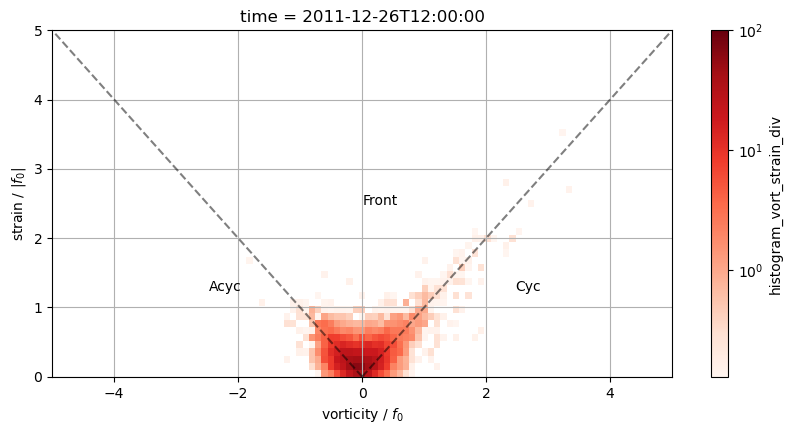

In [40]:
plot_vort_strain_hist(agulhas.isel(time=10).sum(dim=["div_bin"]))

Let's try again but with 24x as many points

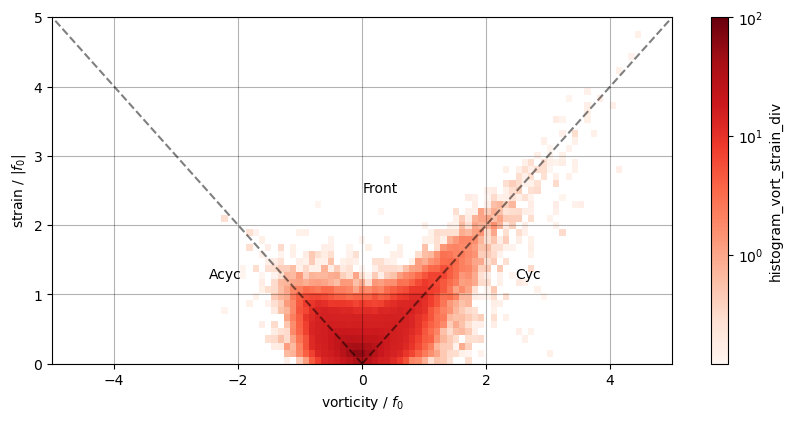

In [41]:
plot_vort_strain_hist(agulhas.isel(time=slice(0,24)).mean(dim='time').sum(dim=["div_bin"]))

So perhaps we should use higher-resolution data in time...

## Seasonal histogram

In [42]:
seasonal_hist = agulhas.groupby("time.season").mean(dim='time')
seasonal_hist = xr.where(seasonal_hist < 1e-5, np.nan, seasonal_hist)

In [43]:
def plot_seasonal_hist(seasonal_hist):

    fig = plt.figure(figsize=(10,4.5))
    
    fg = seasonal_hist.plot(
        col="season", 
        col_wrap=2, 
        robust=True, 
        x="vort_bin", 
        vmax=1e2, 
        norm=mpl.colors.SymLogNorm(1e-4), 
        cmap='Reds',
    )

    strain_max = seasonal_hist.coords["strain_bin"].max()
    vort_max = seasonal_hist.coords["vort_bin"].max()

    for ax, season in zip(fg.axs.flat, ["winter", "summer", "spring", "autumn"]):
        ax.plot(np.linspace(0, -strain_max, 10), np.linspace(0, strain_max, 10), 'k--', alpha=.5)
        ax.plot(np.linspace(0, vort_max), np.linspace(0, vort_max), 'k--', alpha=.5)
        ax.set_title(season)

    # labels
    fg.set_xlabels('vorticity / $f_0$')
    fg.set_ylabels('strain / $|f_0|$')

    #plt.text(0, strain_max / 2, 'Front')
    #plt.text(vort_max / 2, strain_max / 4, 'Cyc')
    #plt.text(-vort_max / 2, strain_max / 4, 'Acyc')

    # grid
    #plt.rc('grid', color='black', alpha=.3)
    fg.map(lambda: plt.rc('grid', color='black', alpha=.3))
    fg.map(lambda: plt.grid())

<Figure size 1000x450 with 0 Axes>

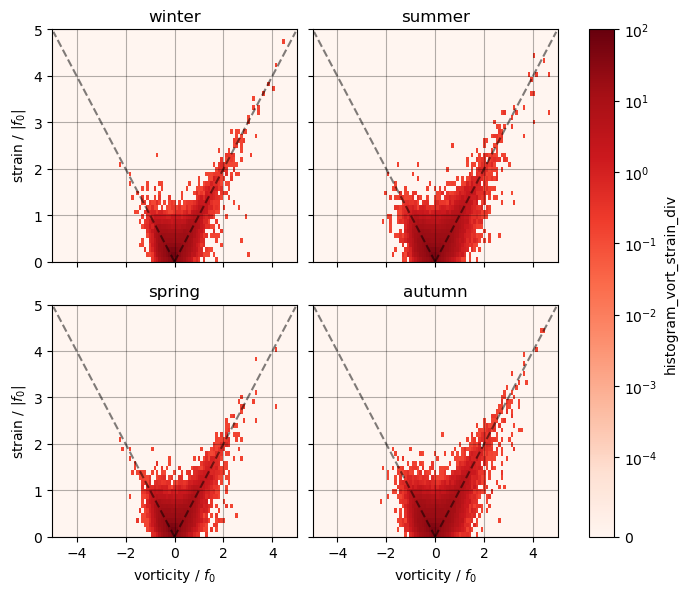

In [44]:
plot_seasonal_hist(seasonal_hist.sum(dim='div_bin'))

## Plot histograms for regions of interest

In [45]:
def plot_regions_of_interest(h):

    h = xr.where(h<1e-5, np.nan, h)  # discard values less than threshold

    plt.figure(figsize=(10,4.5))
    
    # plot the joint PDF
    h.plot(x="vort_bin", vmax=1e2, norm=mpl.colors.SymLogNorm(1e-4), cmap='Reds', col='region', col_wrap=3)

<Figure size 1000x450 with 0 Axes>

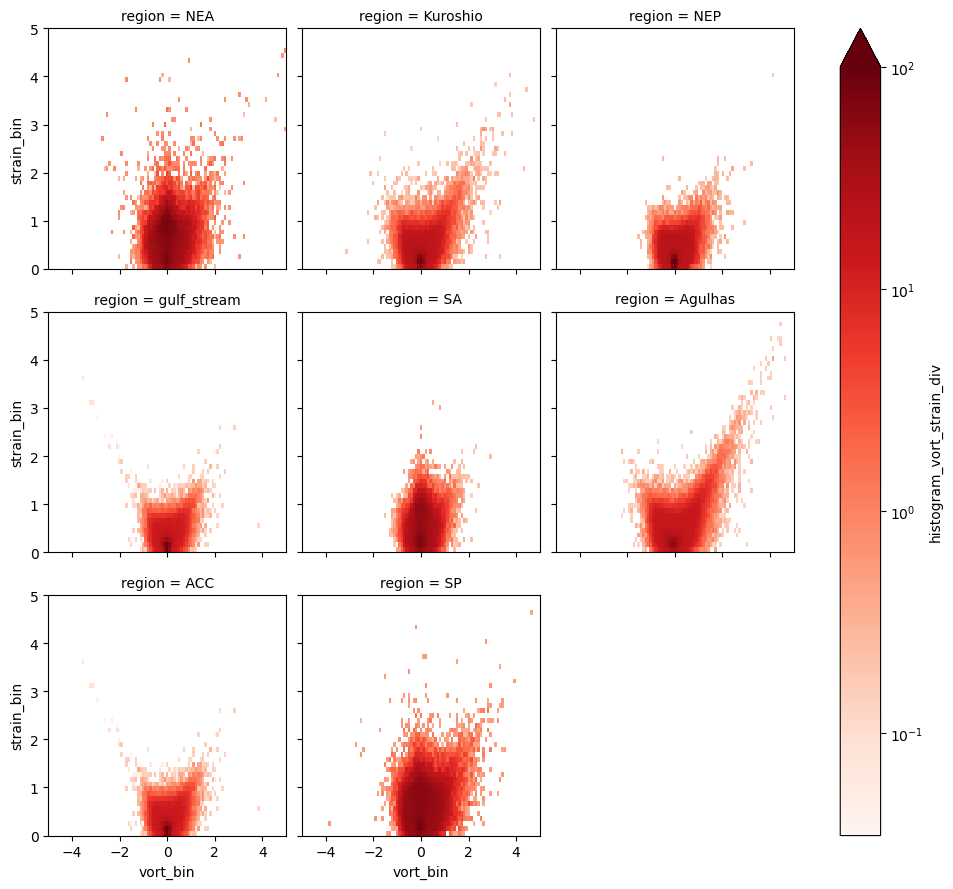

In [46]:
plot_regions_of_interest(regions_of_interest.mean(dim='time').sum(dim='div_bin'))

In [47]:
def plot_regions_of_interest(h):

    h = xr.where(h<1e-5, np.nan, h)  # discard values less than threshold

    plt.figure(figsize=(10,4.5))
    
    # plot the joint PDF
    h.plot(x="vort_bin", vmax=1e4, norm=mpl.colors.SymLogNorm(1e-4), cmap='Reds', col='region', col_wrap=3)

<Figure size 1000x450 with 0 Axes>

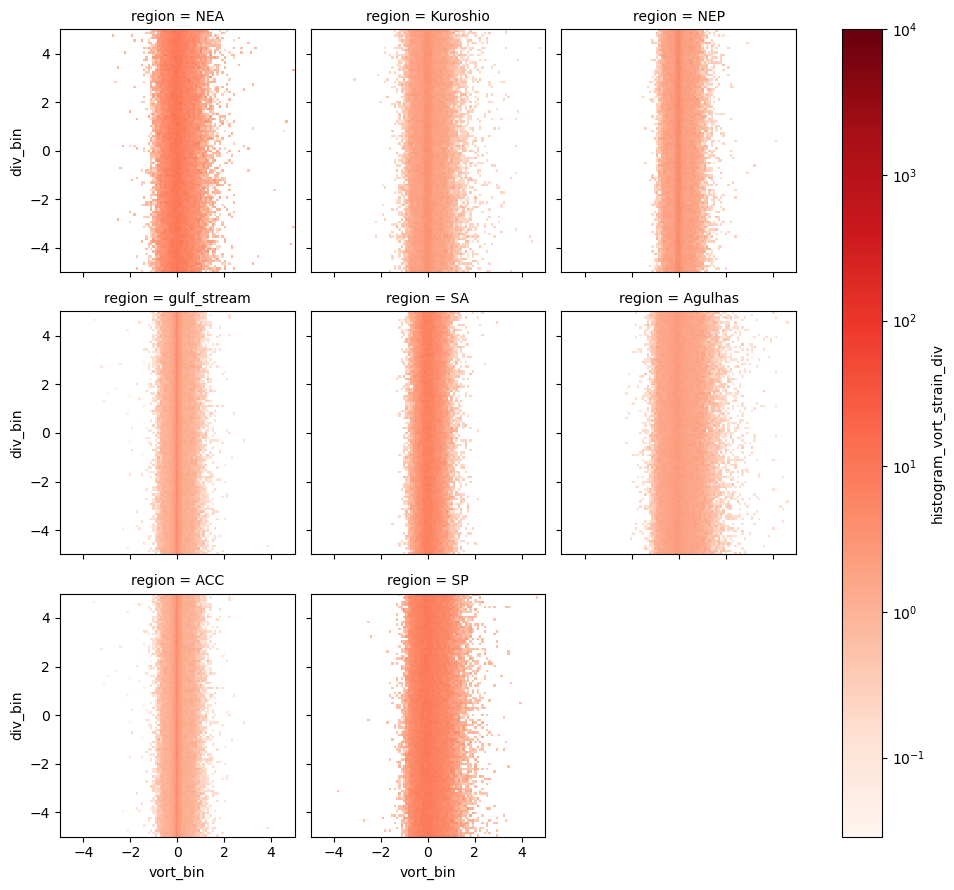

In [48]:
plot_regions_of_interest(regions_of_interest.mean(dim='time').sum(dim='strain_bin'))

In [49]:
def plot_regions_of_interest(h):

    h = xr.where(h<1e-5, np.nan, h)  # discard values less than threshold

    plt.figure(figsize=(10,4.5))
    
    # plot the joint PDF
    h.plot(x="strain_bin", vmax=1e3, norm=mpl.colors.SymLogNorm(1e-4), cmap='Reds', col='region', col_wrap=3)

<Figure size 1000x450 with 0 Axes>

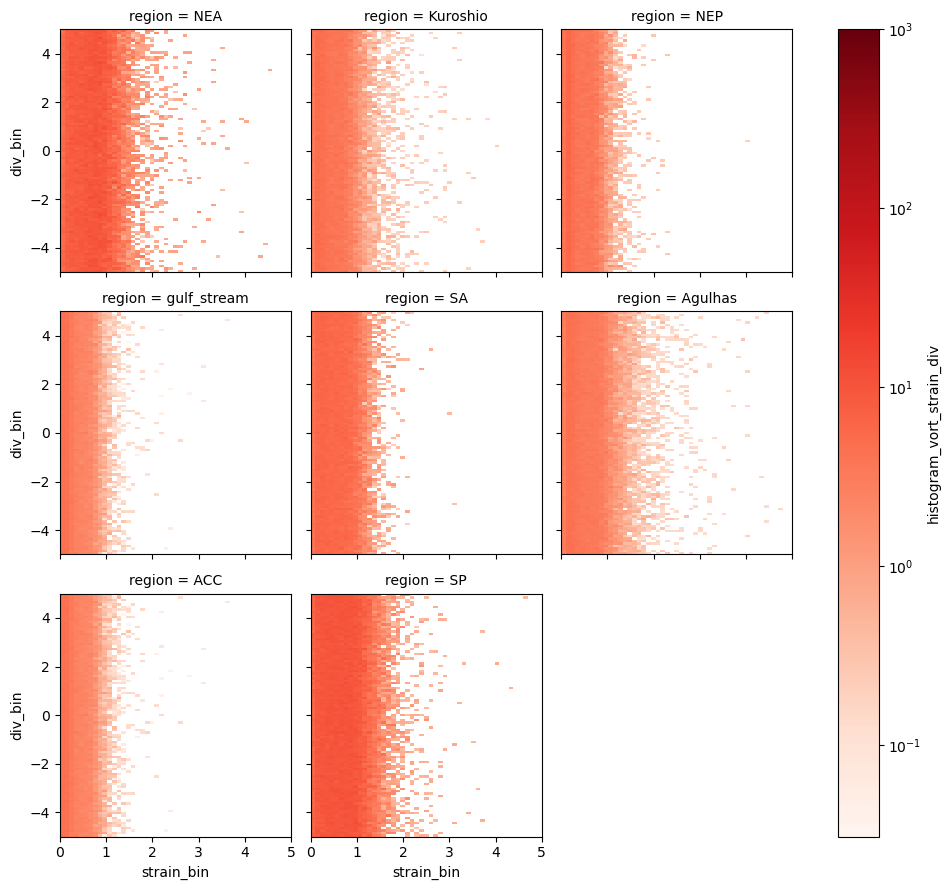

In [50]:
plot_regions_of_interest(regions_of_interest.mean(dim='time').sum(dim='vort_bin'))

## Locate regions

In [ ]:
reg = hist_ds.isel(region=0)

In [ ]:
def plot_region(reg):

    import cartopy.crs as ccrs
    import matplotlib.pyplot as plt

    ax = plt.axes(projection=ccrs.PlateCarree())
    #extents = [-80, -0, -30, -90]
    
    def _bound(val, lower, upper):
        if val < lower:
            return lower
        else:
            return val
        if val > upper:
            return upper
        else:
            return val
        
    extents = [
        _bound(reg.lon_min.values-40, lower=-180, upper=+180),       
        _bound(reg.lon_max.values+40, lower=-180, upper=+180),        
        _bound(reg.lat_min.values+40, lower=-90, upper=+90),        
        _bound(reg.lat_max.values-40, lower=-90, upper=+90),
    ]
    print(extents)
    ax.set_extent(extents)
    #ax.set_global()
    ax.stock_img()


    gl = ax.gridlines(crs=ccrs.PlateCarree(), linewidth=2, color='black', alpha=0.2, linestyle='--', draw_labels=True)
    gl.left_labels = False
    gl.top_labels = False
    gl.right_labels=True

    # x0 x1 y0 y1 

    # lower-left to upper-left
    plt.plot([reg.lon_min.values, reg.lon_min.values], [reg.lat_min.values, reg.lat_max.values],
             color='black', linewidth=2, marker='o', #linestyle="--",
             transform=ccrs.PlateCarree(),
             )

    # lower-left to lower-right
    plt.plot([reg.lon_min.values, reg.lon_max.values], [reg.lat_min.values, reg.lat_min.values],
             color='black', linewidth=2, marker='o', #linestyle="--",
             transform=ccrs.PlateCarree(),
             )

    # upper-left to lower-right
    plt.plot([reg.lon_min.values, reg.lon_max.values], [reg.lat_max.values, reg.lat_max.values],
             color='black', linewidth=2, marker='o', #linestyle="--",
             transform=ccrs.PlateCarree(),
             )

    # upper-left to upper-right
    plt.plot([reg.lon_max.values, reg.lon_max.values], [reg.lat_min.values, reg.lat_max.values],
             color='black', linewidth=2, marker='o', #linestyle="--",
             transform=ccrs.PlateCarree(),
             )

    plt.show()

[-78.59560012817383, 13.235208511352539, -36.32588195800781, -90]


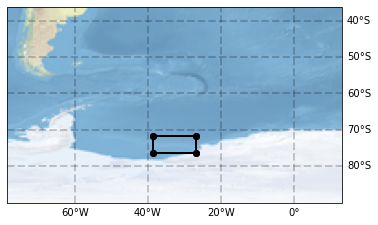

In [ ]:
plot_region(reg)

In [17]:
def region_finder(ds, lat, lon) -> int:
    """Given a lat-lon pair, find the region number containing it"""
    
    da = ds["vort_strain_histogram"].isel(time_coarse=0, vort=0, strain=0)
    
    nonzero = da.where(da.lon_min < lon).where(lon < da.lon_max).where(da.lat_min < lat).where(lat < da.lon_max)
    
    return nonzero.dropna("region").region.values

In [18]:
region_finder(hist_ds, -75, -35)

array([ 32, 603])

[-78.59560012817383, 13.235208511352539, -36.32588195800781, -90]


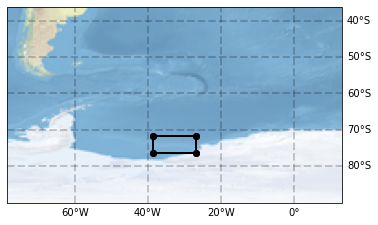

In [19]:
plot_region(hist_ds.sel(region=32))

## Agulhas

In [20]:
region_finder(hist_ds, 0, 0)

array([ 43,  51,  59,  83,  91,  99, 107, 115, 537, 538, 539, 540, 541,
       542, 543, 600, 601, 602, 603])

[-66.73958396911621, 24.489583015441895, 33.075435161590576, -36.53151226043701]


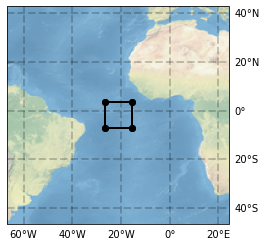

In [21]:
plot_region(hist_ds.sel(region=113))

## Plot histograms

In [121]:
import hvplot.xarray

Given a single region, make all three types of histogram by averaging over given time window

In [125]:
h.isel(time=0, region=85).nbytes / 1e6

3.841992

In [31]:
agulhas = h.sel(region=85).isel(time=20)

In [32]:
def correlation_lines(h: xr.DataArray, xcoord: str, ycoord: str) -> hv.Curve:
    """plot the lines of perfect correlation / anti-correlation"""
    
    xmax = h[xcoord].max().values
    ymax = h[ycoord].max().values
    
    xvals = np.linspace(0, xmax)
    yvals = np.linspace(0, ymax)
    points = [(x, y) for x, y in zip(xvals, yvals)]
    positive_corr_curve = hv.Curve(points).opts(color='black', alpha=0.5, line_dash="dashed")
    
    xvals = np.linspace(0, -xmax)
    yvals = np.linspace(0, ymax)
    points = [(x, y) for x, y in zip(xvals, yvals)]
    negative_corr_curve = hv.Curve(points).opts(color='black', alpha=0.5, line_dash="dashed")
    
    return positive_corr_curve * negative_corr_curve

In [33]:
def vort_strain_plot(h, **kwargs):
    h = xr.where(h<1e-5, np.nan, h)  # discard values less than threshold
    
    h = h.sum(dim="div")
    
    hist_plot = h.hvplot.image(
        x="vort",
        clim=(1e-5, 1e2),
        cnorm="log",
        cmap="reds",
        title="vorticity vs strain JPDF",
        xlabel=r"vorticity / $$f_0$$",
        ylabel=r"strain / $$|f_0|$$",
        padding=0,
        **kwargs,
    ).opts(data_aspect=True)
    
    return hist_plot * correlation_lines(h, xcoord="vort", ycoord="strain")

In [34]:
# TODO improve this by grouping values into discrete levels
# perhaps use https://github.com/bokeh/bokeh/issues/4934

vort_strain_plot(agulhas)

:Overlay
   .Image.I  :Image   [vort,strain]   (vort_strain_div_histogram)
   .Curve.I  :Curve   [x]   (y)
   .Curve.II :Curve   [x]   (y)

In [35]:
def vort_div_plot(h, **kwargs):
    h = xr.where(h<1e-5, np.nan, h)  # discard values less than threshold
    
    h = h.sum(dim="strain")
    
    hist_plot = h.hvplot.image(
        x="vort",
        clim=(1e-5, 1e2),
        cnorm="log",
        cmap="reds",
        title="divergence vs vorticity JPDF",
        xlabel=r"vorticity / $$f_0$$",
        ylabel=r"divergence / $$|f_0|$$",
        padding=0,
        **kwargs,
    ).opts(data_aspect=True)
    
    return hist_plot

In [36]:
vort_div_plot(agulhas)

:Image   [vort,div]   (vort_strain_div_histogram)

In [37]:
def strain_div_plot(h, **kwargs):
    h = xr.where(h<1e-5, np.nan, h)  # discard values less than threshold
    
    h = h.sum(dim="vort")
    
    hist_plot = h.hvplot.image(
        x="div",
        clim=(1e-5, 1e2),
        cnorm="log",
        cmap="reds",
        title="divergence vs strain JPDF",
        xlabel=r"strain / $$|f_0|$$",
        ylabel=r"divergence / $$|f_0|$$",
        padding=0,
        **kwargs,
    ).opts(data_aspect=True)
    
    return hist_plot * correlation_lines(h, xcoord="strain", ycoord="div")

In [38]:
strain_div_plot(agulhas)

:Overlay
   .Image.I  :Image   [div,strain]   (vort_strain_div_histogram)
   .Curve.I  :Curve   [x]   (y)
   .Curve.II :Curve   [x]   (y)

In [39]:
def triple_hist_plot(da):
    return vort_strain_plot(da, colorbar=False) + vort_div_plot(da, colorbar=False) + strain_div_plot(da)

## Interactively explore histograms

Given a single region, make all three types of histogram by averaging over given time window

In [9]:
import hvplot.xarray

In [10]:
def vort_strain_hist():
    ...

In [11]:
def plot_all_hists(da):
    ...

In [186]:
hist = hist_ds["vort_strain_div_histogram"]

In [125]:
h.isel(time=0, region=85).nbytes / 1e6

3.841992

In [31]:
agulhas = h.sel(region=85).isel(time=20)

In [15]:
# Want to replicate this but dynamically, and x3

# This function won't work if hvplot has been imported...
def plot_vort_strain_hist(h):

    h = xr.where(h<1e-5, np.nan, h)  # discard values less than threshold

    h = h.sum(dim="div")

    plt.figure(figsize=(10,4.5))

    # plot the joint PDF
    h.plot(x="vort", vmax=1e2, norm=mpl.colors.SymLogNorm(1e-4), cmap='Reds')

    # plot the lines of perfect correlation / anti-correlation
    strain_max = h.coords["strain"].max()
    plt.plot(np.linspace(0, -strain_max, 10), np.linspace(0, strain_max, 10),'k--',alpha=.5)
    vort_max = h.coords["vort"].max()
    plt.plot(np.linspace(0, vort_max), np.linspace(0, vort_max),'k--',alpha=.5)

    # labels
    plt.xlabel('vorticity / $f_0$')
    plt.ylabel('strain / $|f_0|$')

    plt.text(0, strain_max / 2, 'Front')
    plt.text(vort_max / 2, strain_max / 4, 'Cyc')
    plt.text(-vort_max / 2, strain_max / 4, 'Acyc')

    # grid
    plt.rc('grid', color='black', alpha=.3)
    plt.grid()

    plt.plot()

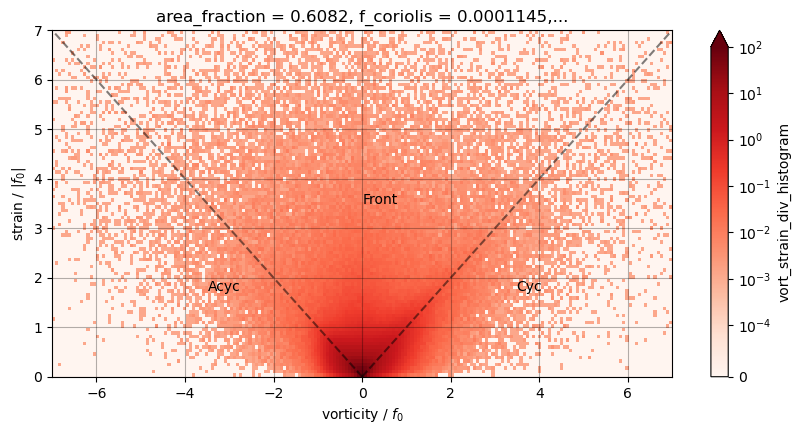

In [16]:
plot_vort_strain_hist(agulhas)

In [32]:
def correlation_lines(h: xr.DataArray, xcoord: str, ycoord: str) -> hv.Curve:
    """plot the lines of perfect correlation / anti-correlation"""
    
    xmax = h[xcoord].max().values
    ymax = h[ycoord].max().values
    
    xvals = np.linspace(0, xmax)
    yvals = np.linspace(0, ymax)
    points = [(x, y) for x, y in zip(xvals, yvals)]
    positive_corr_curve = hv.Curve(points).opts(color='black', alpha=0.5, line_dash="dashed")
    
    xvals = np.linspace(0, -xmax)
    yvals = np.linspace(0, ymax)
    points = [(x, y) for x, y in zip(xvals, yvals)]
    negative_corr_curve = hv.Curve(points).opts(color='black', alpha=0.5, line_dash="dashed")
    
    return positive_corr_curve * negative_corr_curve

In [33]:
def vort_strain_plot(h, **kwargs):
    h = xr.where(h<1e-5, np.nan, h)  # discard values less than threshold
    
    h = h.sum(dim="div")
    
    hist_plot = h.hvplot.image(
        x="vort",
        clim=(1e-5, 1e2),
        cnorm="log",
        cmap="reds",
        title="vorticity vs strain JPDF",
        xlabel=r"vorticity / $$f_0$$",
        ylabel=r"strain / $$|f_0|$$",
        padding=0,
        **kwargs,
    ).opts(data_aspect=True)
    
    return hist_plot * correlation_lines(h, xcoord="vort", ycoord="strain")

In [34]:
# TODO improve this by grouping values into discrete levels
# perhaps use https://github.com/bokeh/bokeh/issues/4934

vort_strain_plot(agulhas)

:Overlay
   .Image.I  :Image   [vort,strain]   (vort_strain_div_histogram)
   .Curve.I  :Curve   [x]   (y)
   .Curve.II :Curve   [x]   (y)

In [35]:
def vort_div_plot(h, **kwargs):
    h = xr.where(h<1e-5, np.nan, h)  # discard values less than threshold
    
    h = h.sum(dim="strain")
    
    hist_plot = h.hvplot.image(
        x="vort",
        clim=(1e-5, 1e2),
        cnorm="log",
        cmap="reds",
        title="divergence vs vorticity JPDF",
        xlabel=r"vorticity / $$f_0$$",
        ylabel=r"divergence / $$|f_0|$$",
        padding=0,
        **kwargs,
    ).opts(data_aspect=True)
    
    return hist_plot

In [36]:
vort_div_plot(agulhas)

:Image   [vort,div]   (vort_strain_div_histogram)

In [37]:
def strain_div_plot(h, **kwargs):
    h = xr.where(h<1e-5, np.nan, h)  # discard values less than threshold
    
    h = h.sum(dim="vort")
    
    hist_plot = h.hvplot.image(
        x="div",
        clim=(1e-5, 1e2),
        cnorm="log",
        cmap="reds",
        title="divergence vs strain JPDF",
        xlabel=r"strain / $$|f_0|$$",
        ylabel=r"divergence / $$|f_0|$$",
        padding=0,
        **kwargs,
    ).opts(data_aspect=True)
    
    return hist_plot * correlation_lines(h, xcoord="strain", ycoord="div")

In [38]:
strain_div_plot(agulhas)

:Overlay
   .Image.I  :Image   [div,strain]   (vort_strain_div_histogram)
   .Curve.I  :Curve   [x]   (y)
   .Curve.II :Curve   [x]   (y)

In [39]:
def triple_hist_plot(da):
    return vort_strain_plot(da, colorbar=False) + vort_div_plot(da, colorbar=False) + strain_div_plot(da)

In [269]:
triple_hist_plot(agulhas)

:Layout
   .Overlay.I  :Overlay
      .Image.I  :Image   [vort,strain]   (vort_strain_div_histogram)
      .Curve.I  :Curve   [x]   (y)
      .Curve.II :Curve   [x]   (y)
   .Image.I    :Image   [vort,div]   (vort_strain_div_histogram)
   .Overlay.II :Overlay
      .Image.I  :Image   [div,strain]   (vort_strain_div_histogram)
      .Curve.I  :Curve   [x]   (y)
      .Curve.II :Curve   [x]   (y)

## EOF analysis

Try on one region first, over the whole timeseries

In [26]:
from eofs.xarray import Eof

In [27]:
time_along_first_dim = hist_ds.transpose("time_coarse", "strain", "vort", "region")["vort_strain_histogram"]

In [28]:
solver = Eof(time_along_first_dim.sel(region=32))

In [29]:
eof1, eof2, eof3, eof4 = solver.eofsAsCorrelation(neofs=4)
pcs = solver.pcs(npcs=3, pcscaling=1)

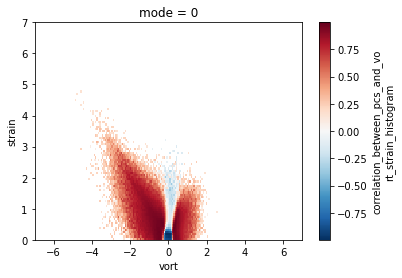

In [30]:
eof1.plot()

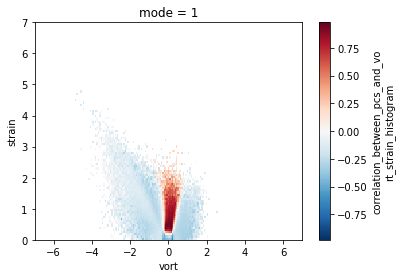

In [31]:
eof2.plot()

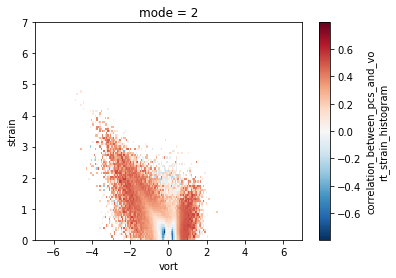

In [32]:
eof3.plot()

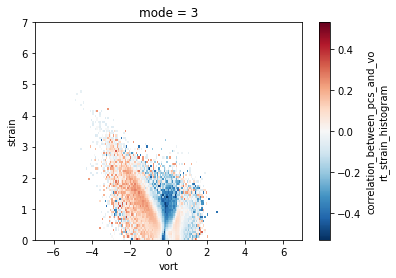

In [33]:
eof4.plot()

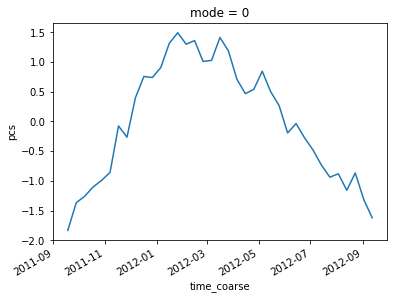

In [34]:
pcs.sel(mode=0).plot()

Now try for all locations

In [35]:
weights = np.sqrt(np.abs(np.cos(hist_ds["lat_centre"])))
weights

<xarray.DataArray 'lat_centre' (region: 437)>
array([0.39235824, 0.9710613 , 0.971022  , 0.97219795, 0.97632045,
       0.982412  , 0.98899096, 0.6934918 , 0.6934918 , 0.6934918 ,
       0.6934918 , 0.6934918 , 0.6934918 , 0.6934918 , 0.6934918 ,
       0.99787146, 0.99787146, 0.99787146, 0.99787146, 0.99787146,
       0.99787146, 0.99787146, 0.99787146, 0.9515217 , 0.9515217 ,
       0.9515217 , 0.9515217 , 0.9515217 , 0.9515217 , 0.9515217 ,
       0.9515217 , 0.9999168 , 0.9999168 , 0.9999168 , 0.9999168 ,
       0.9999168 , 0.9999168 , 0.9999168 , 0.9999168 , 0.49379778,
       0.49379778, 0.49379778, 0.49379778, 0.49379778, 0.49379778,
       0.49379778, 0.49379778, 0.9712954 , 0.9712954 , 0.9712954 ,
       0.9712954 , 0.9712954 , 0.9712954 , 0.9712954 , 0.9955573 ,
       0.9955573 , 0.9955573 , 0.9955573 , 0.9955573 , 0.9185634 ,
       0.9185634 , 0.9185634 , 0.9185634 , 0.9185634 , 0.39572093,
       0.39572093, 0.39572093, 0.39572093, 0.39572093, 0.827373  ,
       0.827373  , 0.98829484, 0.98829484, 0.9911167 , 0.9911167 ,
       0.7868377 , 0.7868377 , 0.7868377 , 0.7868377 , 0.7868377 ,
       0.8784944 , 0.8784944 , 0.8784944 , 0.38214958, 0.38214958,
       0.38214958, 0.5737814 , 0.42435816, 0.23970577, 0.9998472 ,
       0.9305942 , 0.738053  , 0.5767641 , 0.6016785 , 0.98743093,
       0.9792082 , 0.9792082 , 0.6934918 , 0.6934918 , 0.6934918 ,
...
       0.9980763 , 0.9311658 , 0.9911167 , 0.98829484, 0.98829484,
       0.9911167 , 0.98829484, 0.98743093, 0.7868377 , 0.9911167 ,
       0.98829484, 0.9305942 , 0.42435816, 0.38214958, 0.8784944 ,
       0.7868377 , 0.9911167 , 0.98829484, 0.5737814 , 0.38214958,
       0.8784944 , 0.7868377 , 0.9911167 , 0.98829484, 0.827373  ,
       0.39572093, 0.9185634 , 0.9955573 , 0.9712954 , 0.49379778,
       0.9999168 , 0.9515217 , 0.827373  , 0.39572093, 0.9185634 ,
       0.9955573 , 0.9712954 , 0.49379778, 0.9999168 , 0.9515217 ,
       0.827373  , 0.39572093, 0.9185634 , 0.9955573 , 0.9712954 ,
       0.49379778, 0.9999168 , 0.9515217 , 0.827373  , 0.39572093,
       0.9185634 , 0.9955573 , 0.9712954 , 0.49379778, 0.9999168 ,
       0.9515217 , 0.9955573 , 0.9712954 , 0.49379778, 0.9999168 ,
       0.9515217 , 0.827373  , 0.49379778, 0.9999168 , 0.9515217 ,
       0.827373  , 0.9712954 , 0.49379778, 0.9999168 , 0.9515217 ,
       0.99787146, 0.6934918 , 0.9995732 , 0.972855  , 0.99787146,
       0.6934918 , 0.99975014, 0.9785637 , 0.99787146, 0.6934918 ,
       0.9987315 , 0.99787146, 0.6934918 , 0.99588233, 0.99787146,
       0.6934918 , 0.99088985, 0.99787146, 0.6934918 , 0.99787146,
       0.6934918 , 0.9780679 , 0.28579256, 0.99787146, 0.6934918 ,
       0.9731959 , 0.27833584], dtype=float32)
Coordinates: (12/13)
    area_fraction  (region) float64 0.9951 1.0 1.0 0.9284 ... 0.9943 1.0 1.0 1.0
    f_coriolis     (region) float32 -0.0001402 -0.0001365 ... -0.0001401
    i_max          (region) int16 540 540 1080 1620 2160 ... 540 1080 1620 2160
    i_min          (region) int16 0 0 540 1080 1620 ... 1620 0 540 1080 1620
    j_max          (region) int16 2700 3240 3240 3240 ... 4320 4320 4320 4320
    j_min          (region) int16 2160 2700 2700 2700 ... 3780 3780 3780 3780
    ...             ...
    lat_min        (region) float32 -76.33 -71.65 -71.65 ... -71.63 -76.23
    lon_max        (region) float32 -26.76 -26.76 -15.49 ... -38.01 -38.04
    lon_min        (region) float32 -38.6 -38.02 -26.74 ... -49.24 -49.29 -50.27
  * region         (region) int64 32 40 41 42 43 44 ... 818 819 824 825 826 827
    lon_centre     (region) float32 -32.68 -32.39 -21.12 ... -43.65 -44.16
    lat_centre     (region) float32 -73.98 -69.45 -69.45 ... -64.9 -69.44 -73.9

In [36]:
#solver = Eof(time_along_first_dim, weights=weights)